# <font color="red"> Figures and analysis
</font>This notebook contains scripts for producing the main figures and results accompanying the manuscript. Here we perform basic organization and processing of data, which is then passed to functions in **figures.py** (available at this GitHub repository) for detailed formatting. The figures produced are stored as PDFs in the **/figures** folder.

## **Contents**

- ### [Libraries and variables](#lib)
- ### [Figures and data analysis](#fig)
    - #### [Figure 1 Recovering selection on individual mutations and traits from temporal genetic data](#Figure_1) 
    - #### [Figure 2 CD8+ T cell escape is strongly selected and contributes substantially to intrahost HIV-1 fitness gains](#Figure_2)
    - #### [Figure 3 Estimates of selection for CD8+ T cell escape in a simple example](#Figure_3)
    - #### [Figure 4 Inclusion of escape as a trait increases the inferred selective advantage of escape and decreases the apparent advantage of individual escape mutations](#Figure_4)
    - #### [Figure 5 Inclusion of escape as a trait only strongly affects inferred selection coefficients for escape mutations and alleles that are strongly linked to them](#Figure_5)
    - #### [Supplementary Figure 1 MPL recovers selection from complex dynamics even from limited data](#su:Figure_1)
    - #### [Supplementary Figure 2 MPL recovers selection from complex dynamics even from limited data](#su:Figure_2)
    - #### [Supplementary Figure 3 Inclusion of escape coefficients substantially shifts inferred selection coefficients for escape mutations toward more deleterious values](#su:Figure_3)
    - #### [Supplementary Figure 4 The contribution of reversions to intrahost HIV-1 fitness gains is significant and grows over time](#su:Figure_4) 
    - #### [Supplementary Figure 5 The distribution of inferred selection coefficients with and without the inclusion of escape traits](#su:Figure_5)
    - #### [Supplementary Figure 6 Intrahost HIV-1 fitness gains due to CD8+ T cell escape mutations and reversions](#su:Figure_6)
    - #### [Supplementary Figure 7 Distribution of all selection coefficients and trait coefficients for 100 replicating simulations](#su:Figure_7)
    - #### [Supplementary Figure 8 Effects of recombination on inferred escape coefficients in HIV-1 data](#su:Figure_8)
    - #### [Supplementary Figure Inferred selection coefficients for escape sites without vs with escape trait](#su:Figure_sc)
    - #### [Supplementary Figure Fitness gain due to reversion mutations, escape mutations and the sum of them](#su:Figure_CH042)


<a id='lib'></a>
## Libraries and variables

In [1]:
# Full library list and version numbers

print('This notebook was prepared using:')

import sys, os
from copy import deepcopy
from importlib import reload
print('python version %s' % sys.version)

import numpy as np
print('numpy version %s' % np.__version__)

import scipy as sp
import scipy.stats as st
print('scipy version %s' % sp.__version__)

import pandas as pd
print('pandas version %s' % pd.__version__)

import matplotlib
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.image as mpimg
print('matplotlib version %s' % matplotlib.__version__)

from PIL import Image
import seaborn as sns

import re
import importlib
import figures as fig
import mplot as mp

# GitHub directories
HIV_DIR = 'data/HIV'
MPL_DIR = 'src/MPL'
SIM_DIR = 'data/simulation'
FIG_DIR = 'figures'
HIV_MPL_DIR = 'src/MPL/HIV'

This notebook was prepared using:
python version 3.10.9 | packaged by conda-forge | (main, Feb  2 2023, 20:26:08) [Clang 14.0.6 ]
numpy version 1.24.2
scipy version 1.10.1
pandas version 1.5.3
matplotlib version 3.7.1


<a id='fig'></a>
## Figures and data analysis

<a id='Figure_1'></a>
### Figure 1. Recovering selection on individual mutations and traits from temporal genetic data
a. allele frequencies; b. binary trait frequencies; 
c. inferred selection coefficients for individual locus; d. inferred selection coefficients for binary trait
e. fitness schematic

Figure saved as fig1-sim.pdf


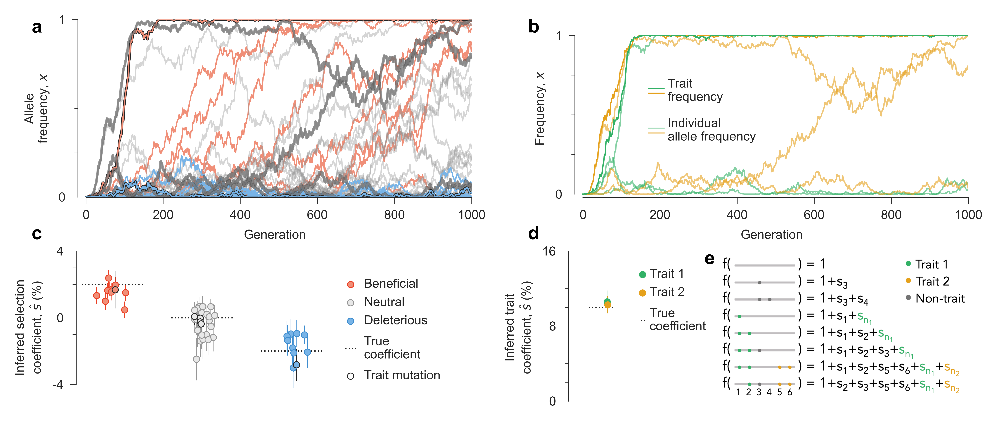

In [2]:
importlib.reload(mp)
importlib.reload(fig)

pdata = {
    'n_gen':   1000,                            # number of generations
    'dg':      1,                               # spacing between generations for plot
    'N':       1000,                            # population size
    'xfile':   '20_ns1000_dt1',                 # file in directory data/ containing example trajectory
    'n_ben':   10,                              # number of beneficial mutations
    'n_neu':   30,                              # number of neutral mutations
    'n_del':   10,                              # number of deleterious mutations
    'n_tra':   2,                               # number of trait groups([1,2,3],[11,12,13])
    's_ben':   0.02,                            # selection coefficient of beneficial mutations
    's_neu':   0,                               # selection coefficient of neutral mutations
    's_del':   -0.02,                           # selection coefficient of deleterious mutations
    's_tra':   0.1,                             # trait coefficient
    'r_seed':  1,                               # random seed for scattering inferred selection coefficients
    'show_fig':True,                            # if show figure here and save it in figures folder
}

fig.plot_example_mpl(**pdata)
plt.show()

# '''plot path and inferrred coefficients for all examples'''
# pdata['show_fig'] = False
# for i in range(100):
#     pdata['xfile'] = str(i)+'_ns1000_dt1'
#     fig.plot_example_mpl(**pdata)

<a id='Figure_2'></a>
### Figure 2.  CD8+ T cell escape is strongly selected and contributes substantially to intrahost HIV-1 fitness gains
a. trait coefficients histogram,\
b. fitness gain fraction due to escape trait. \
Fraction = (sum of all trait coefficients + sum of selection coefficients for special sites)/(total fitness - 1). \
Set the range of the value is [0,1].

There are 37 epitopes can be seen as the binary traits.
Highest escape coefficient: 0.2589403, average escape coefficient: 0.07546563543243245
Median escape coefficient: 0.04613127, lowest escape coefficient: -0.006756778
Figure saved as fig2-HIV.pdf


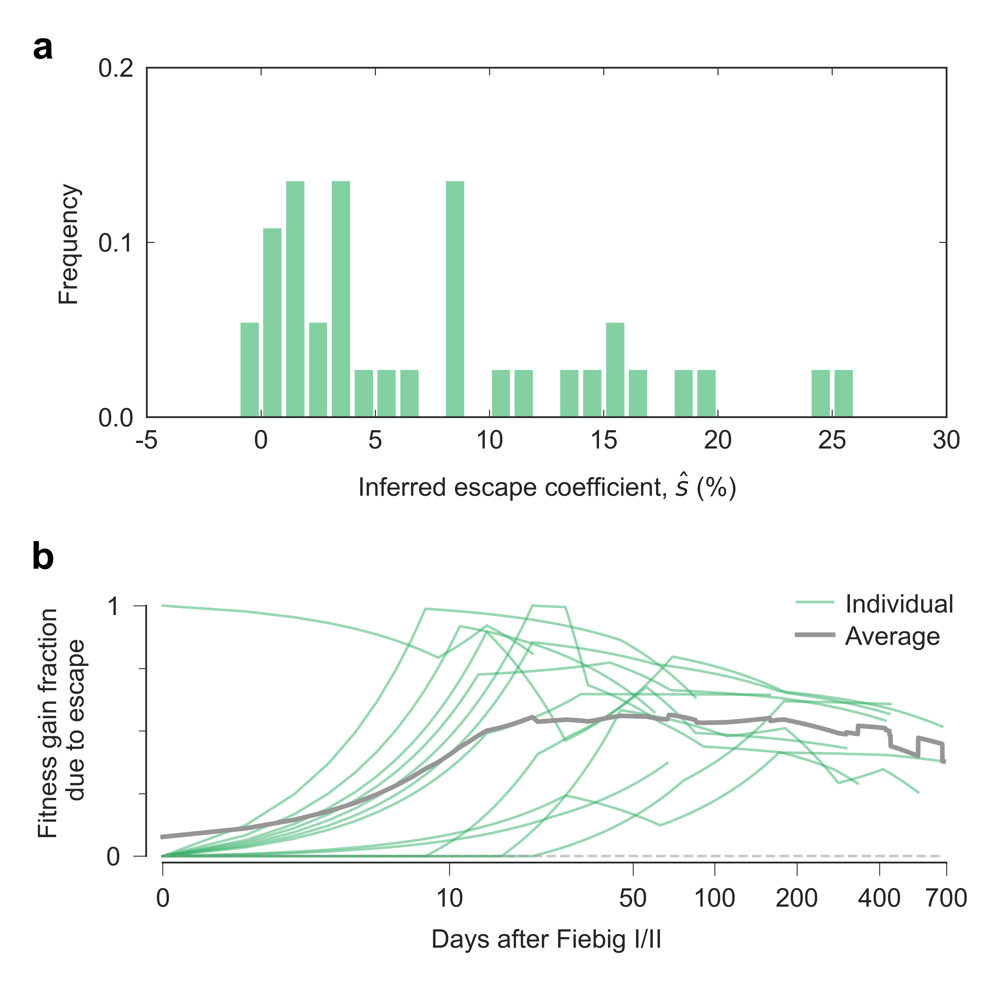

In [3]:
import re

importlib.reload(mp)
importlib.reload(fig)

pdata = {
    'tags':['700010040-3','700010040-5','700010058-3','700010058-5','700010077-3','700010077-5',
            '700010470-3','700010470-5','700010607-3','700010607-5','703010131-3','703010131-5',
            '703010159-3','703010159-5','703010256-3','703010256-5','704010042-3','704010042-5',
            '705010162-3','705010162-5','705010185-3','705010185-5','705010198-3','705010198-5',
            '706010164-3','706010164-5'],
    'ppts':['700010040', '700010058', '700010077', '700010470', '700010607', '703010131', 
            '703010159', '703010256', '704010042', '705010162', '705010185', '705010198', 
            '706010164'],
}

fig.plot_histogram_fraction_HIV(**pdata)
plt.show()

<a id='Figure_3'></a>
### Figure 3. Estimates of selection for CD8+ T cell escape in a simple example
CH470-3 \
a. variant frequency for all epitopes on CH470-3; b. inferred binary trait coefficients

Figure saved as fig3-CH470-3.pdf


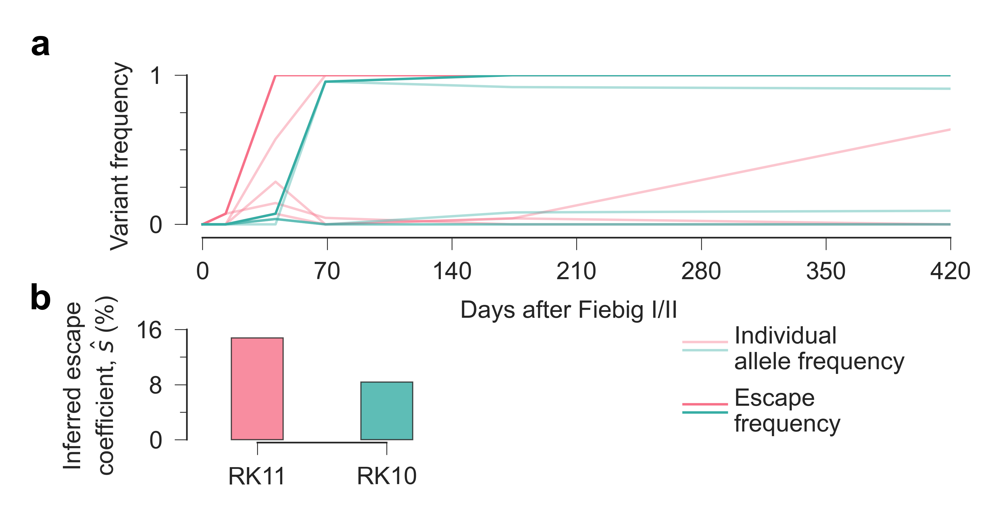

In [4]:
import re

importlib.reload(mp)
importlib.reload(fig)

pdata = {
    'patient':       '700010470',
    'region' :       '3',
    'epitope':       ['RLAYQHIAKEK','RIKTWKSLVK'],
    'traj_ticks':    [0, 70, 140, 210, 280, 350, 420],   
}

fig.plot_CH470_3(**pdata)
plt.show()

<a id='Figure_4'></a>
### Figure 4. Inclusion of escape as a trait increases the inferred selective advantage of escape and decreases the apparent advantage of individual escape mutations
CH131-3\
a. variant frequency for epitope EV11; bc. inferred selection coefficients for all variants in epitope

Figure saved as fig4-CH131-3_escape.pdf


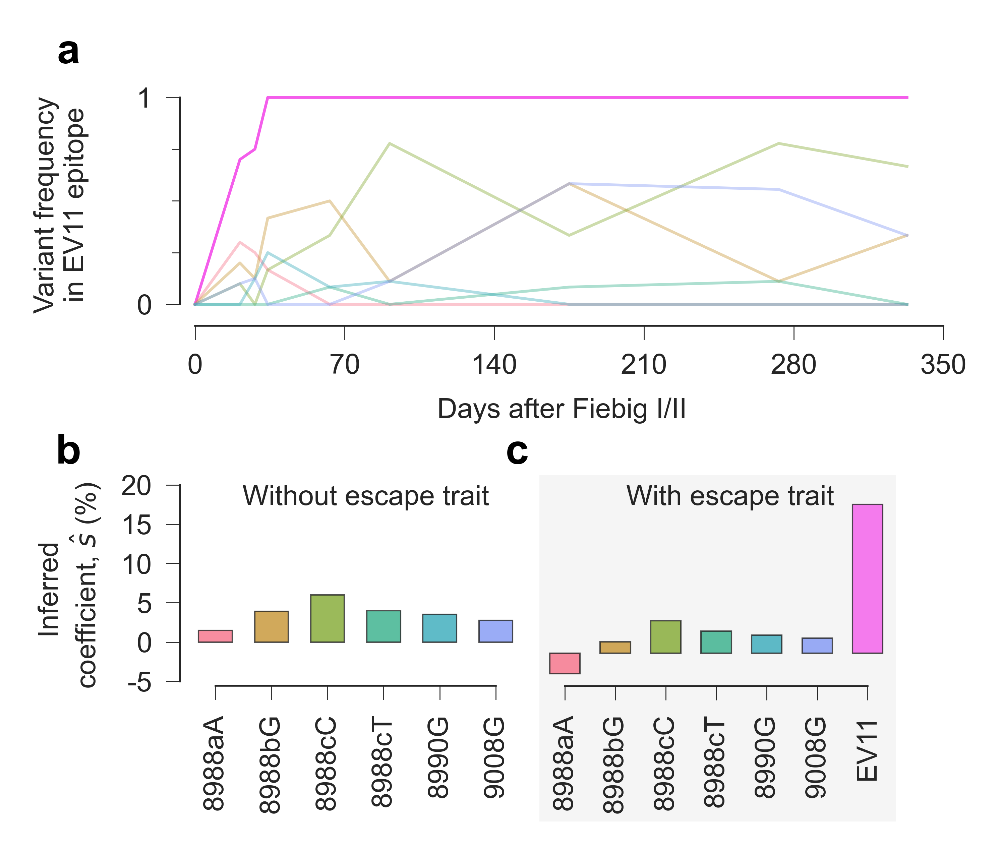

In [5]:
importlib.reload(mp)
importlib.reload(fig)

pdata = {
    'patient':       '703010131',
    'region' :       '3',
    'epitope':       ['EEVGFPVKPQV'],
    'traj_ticks':    [0, 70, 140, 210, 280, 350],   
}

fig.plot_CH131_3(**pdata)

<a id='Figure_5'></a>
### Figure 5.  Inclusion of escape as a trait only strongly affects inferred selection coefficients for escape mutations and alleles that are strongly linked to them
CH470-5\
a. inferred selection coefficients with vs. without binary trait terms
b. frequncies for relative mutant variants
c. heatmap for sij

Figure saved as fig5-CH470-5_linkage.pdf


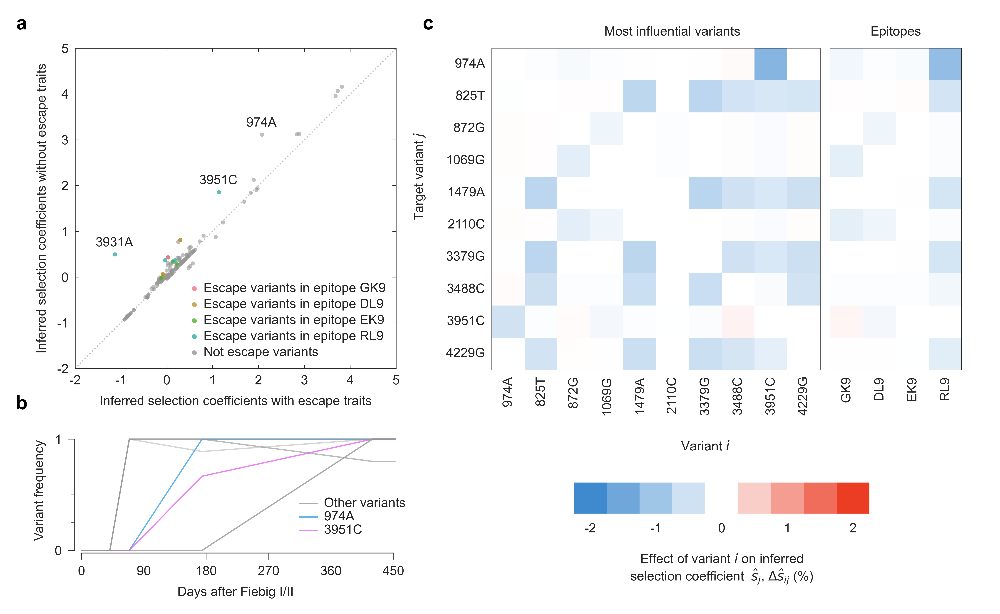

In [6]:
importlib.reload(mp)
importlib.reload(fig)

pdata = {
    'tag':           '700010470-5',
    'traj_ticks':    [0, 90,180,270,360,450], 
    'variants':      ['17_A','3_T','9_G','23_G','37_A','55_C','124_G','130_C','152_C','168_G'],
    'high_var':      [17,152],
    'note_var':      ['17_A','149_A','152_C'],
}

fig.plot_CH470_5(**pdata)

<a id='su:Figure_1'></a>
### Supplementary Figure 1. Recovering selection from-varying data 
a. allele frequencies; b. binary trait frequencies; c. inferred selection coefficients for individual locus; d. inferred selection coefficients for binary trait (true value is time-varying value)

Figure saved as sufig-sim-tv.pdf


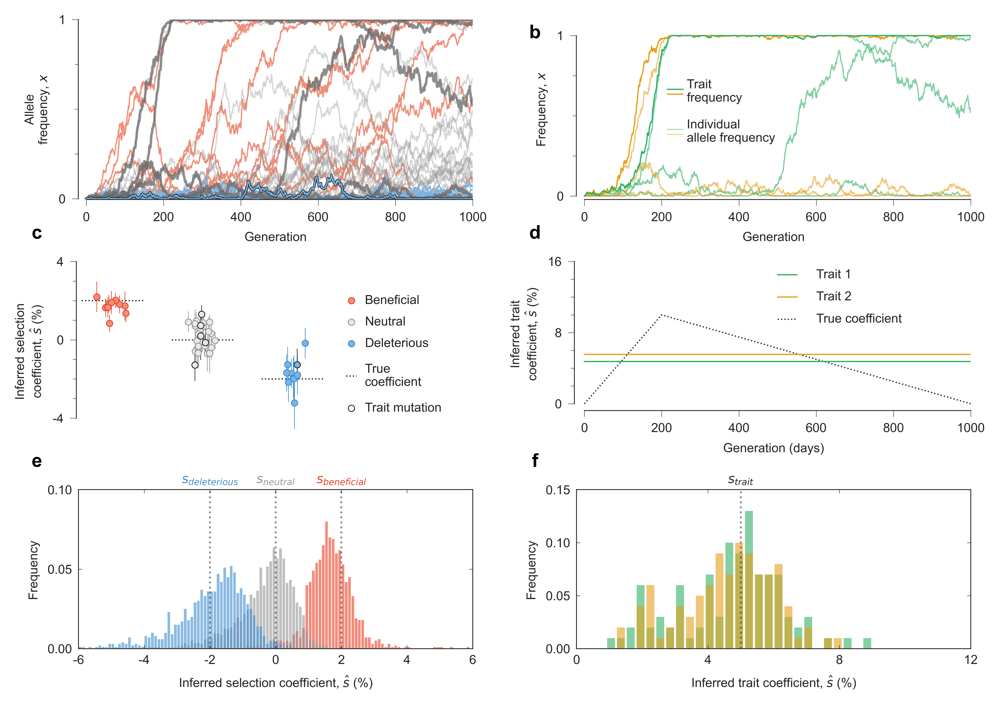

In [7]:

importlib.reload(mp)
importlib.reload(fig)

generations = 1000
t1          = 200
t2          = generations - t1
fn          = np.zeros(generations+1)

for t in range(t1):
    fn[t] = 0.1/t1*t
for t in range(t1,generations+1):
    fn[t] = 0.1 - (0.1)/t2*(t-t1)
    
pdata = {
    'n_gen':   generations,                  # number of generations
    'dg':      1,                            # spacing between generations for plot
    'N':       1000,                         # population size
    'xpath':   'time-varying',               # input file path
    'xfile':   '34_ns1000_dt1',              # file in directory data/ containing example trajectory
    'n_ben':   10,                           # number of beneficial mutations
    'n_neu':   30,                           # number of neutral mutations
    'n_del':   10,                           # number of deleterious mutations
    'n_tra':   2,                            # number of trait groups([1,2,3],[11,12,13])
    's_ben':   0.02,                         # selection coefficient of beneficial mutations
    's_neu':   0.0,                          # selection coefficient of neutral mutations
    's_del':   -0.02,                        # selection coefficient of deleterious mutations
    's_tra':   fn,                           # time-varying trait coefficient
    's_t_a':   0.05,                         # average value for time-varying trait coefficient
    'r_seed':  1,                            # random seed for scattering inferred selection coefficients
}

fig.plot_example_tv(**pdata)

<a id='su:Figure_2'></a>
### Supplementary Figure 2. MPL recovers selection from complex dynamics even from limited data
a. selection coefficients; b. trait coefficients
c. d AUROC e. NRMSE

Figure saved as sim-his.pdf


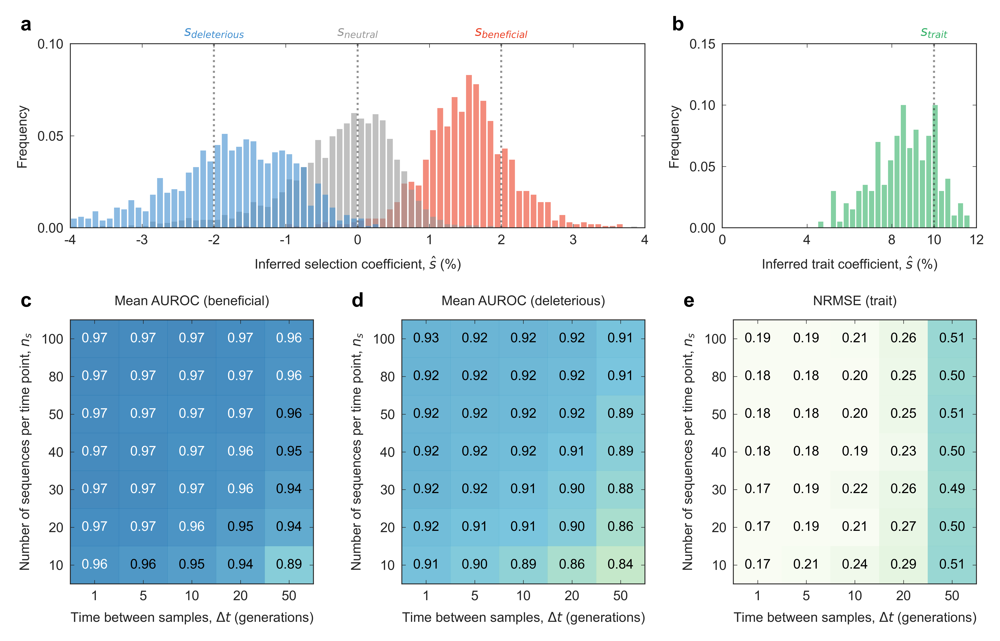

In [8]:
importlib.reload(mp)
importlib.reload(fig)

pdata = {
    'n_ben':   10,                                # number of beneficial mutations
    'n_neu':   30,                                # number of neutral mutations
    'n_del':   10,                                # number of deleterious mutations
    'n_tra':   2,                                 # number of trait groups([1,2,3],[11,12,13])
    's_ben':   0.02,                              # selection coefficient of beneficial mutations
    's_neu':   0,                                 # selection coefficient of neutral mutations
    's_del':   -0.02,                             # selection coefficient of deleterious mutations
    's_tra':   0.1,                               # trait coefficient
}

fig.plot_histogram_sim(**pdata)
plt.show()

<a id='su:Figure_3'></a>
### Supplementary Figure 3. Inferred selection coefficients for escape mutations without vs with escape trait

Totally 219 escape mutations and 48 (21.92%) reversion mutations
For all escape mutations:
Before counting escape term, 80 (36.53%) escape mutations are substantially beneficial (s>1%).
After counting escape term, only 35 (15.98%) escape mutations are substantially beneficial.
Before counting escape term, 190 (86.76%) escape mutations are beneficial (s>0).
After counting escape term, only 135 (61.64%) escape mutations are beneficial.
Figure saved as sc_escape_reversion.pdf


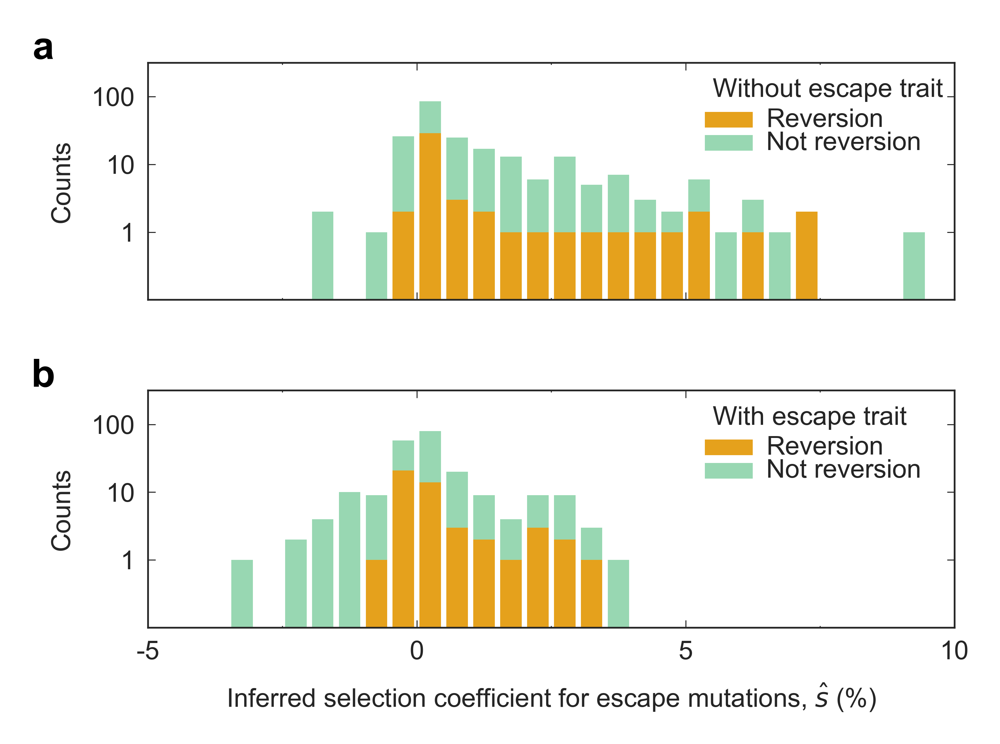

In [9]:
importlib.reload(mp)
importlib.reload(fig)

pdata = {
    'tags':['700010040-3','700010040-5','700010058-3','700010058-5','700010077-3','700010077-5',
            '700010470-3','700010470-5','700010607-3','700010607-5','703010131-3','703010131-5',
            '703010159-3','703010159-5','703010256-3','703010256-5','704010042-3','704010042-5',
            '705010162-3','705010162-5','705010185-3','705010185-5','705010198-3','705010198-5',
            '706010164-3','706010164-5']
}

fig.plot_trait_site_reversion(**pdata)
plt.show()

<a id='su:Figure_4'></a>
### Supplementary figure 4. Fitness gain due to reversion mutations

Figure saved as reversion.pdf


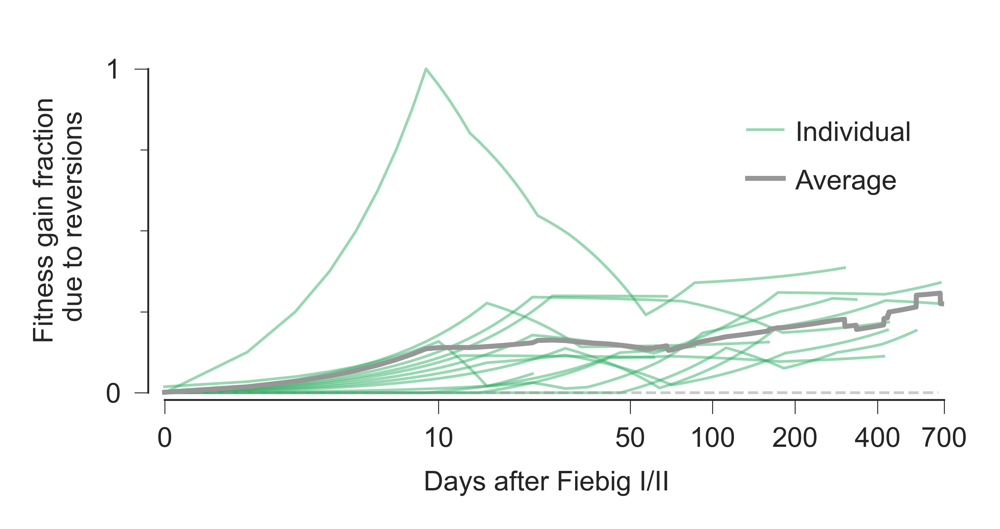

In [10]:
importlib.reload(mp)
importlib.reload(fig)

pdata = {
    'ppts':['700010040', '700010058', '700010077', '700010470', '700010607', '703010131', 
            '703010159', '703010256', '704010042', '705010162', '705010185', '705010198', 
            '706010164']
}

fig.plotReversionFaction(**pdata)
plt.show()

<a id='su:Figure_5'></a>
### Supplementary figure 5. The distribution of inferred selection coefficients with and without the inclusion of escape traits

Figure saved as sc_reversion.pdf


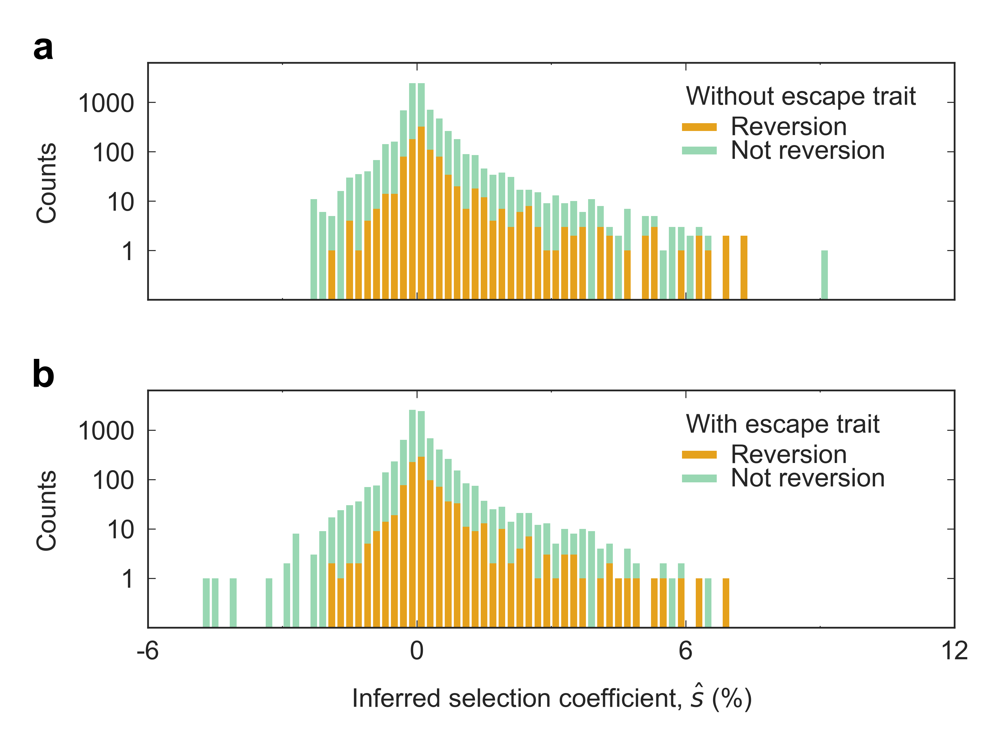

In [11]:
importlib.reload(mp)
importlib.reload(fig)

pdata = {
    'tags':['700010040-3','700010040-5','700010058-3','700010058-5','700010077-3','700010077-5',
            '700010470-3','700010470-5','700010607-3','700010607-5','703010131-3','703010131-5',
            '703010159-3','703010159-5','703010256-3','703010256-5','704010042-3','704010042-5',
            '705010162-3','705010162-5','705010185-3','705010185-5','705010198-3','705010198-5',
            '706010164-3','706010164-5'],
}

fig.plot_site_reversion(**pdata)
plt.show()

<a id='su:Figure_6'></a>
### Supplementary figure 6. Intrahost HIV-1 fitness gains due to CD8+ T cell escape mutations and reversions

Figure saved as fraction_sum.pdf


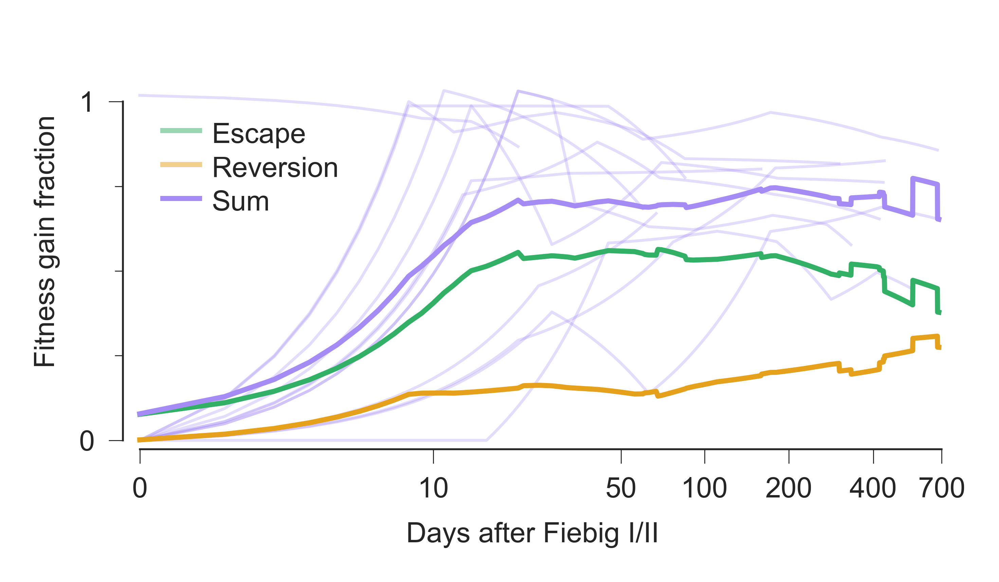

In [12]:
importlib.reload(mp)
importlib.reload(fig)
pdata = {
    'ppts':['700010040', '700010058', '700010077', '700010470', '700010607', '703010131', 
            '703010159', '703010256', '704010042', '705010162', '705010185', '705010198', 
            '706010164']
}
fig.plot_sum_fraction(**pdata)
plt.show()

<a id='su:Figure_7'></a>
### Supplementary Figure 7. Distribution of all selection coefficients and trait coefficients for 100 replicating simulations
a. without recombination term\
b. with recombination term

Figure saved as sim_his_rec.pdf


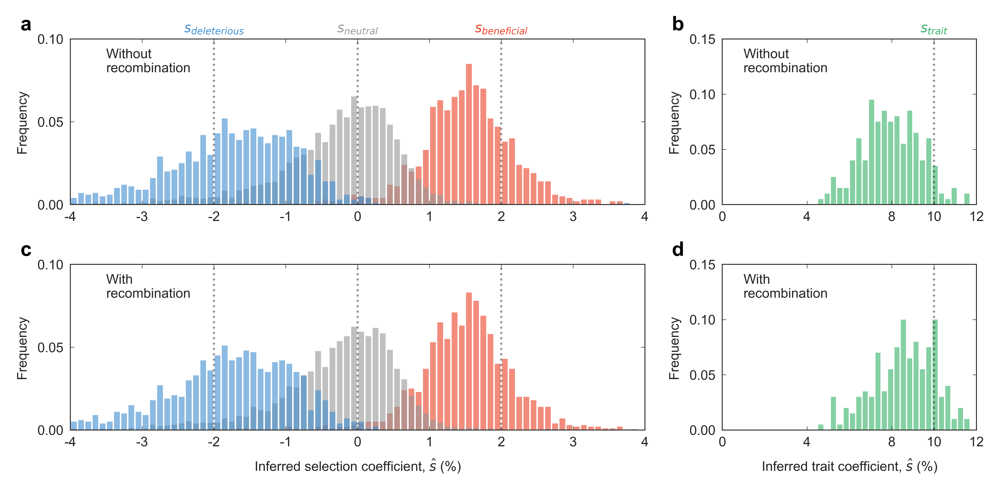

In [13]:
importlib.reload(mp)
importlib.reload(fig)

pdata = {
    'n_ben':   10,                                # number of beneficial mutations
    'n_neu':   30,                                # number of neutral mutations
    'n_del':   10,                                # number of deleterious mutations
    'n_tra':   2,                                 # number of trait groups([1,2,3],[11,12,13])
    's_ben':   0.02,                              # selection coefficient of beneficial mutations
    's_neu':   0,                                 # selection coefficient of neutral mutations
    's_del':   -0.02,                             # selection coefficient of deleterious mutations
    's_tra':   0.1,                               # trait coefficient
}

fig.plot_histogram_sim_rec(**pdata)
plt.show()

<a id='su:Figure_8'></a>
### Supplementary Figure 8. The distribution of inferred selection coefficients with and without the inclusion of escape traits

Figure saved as tc_rec.pdf


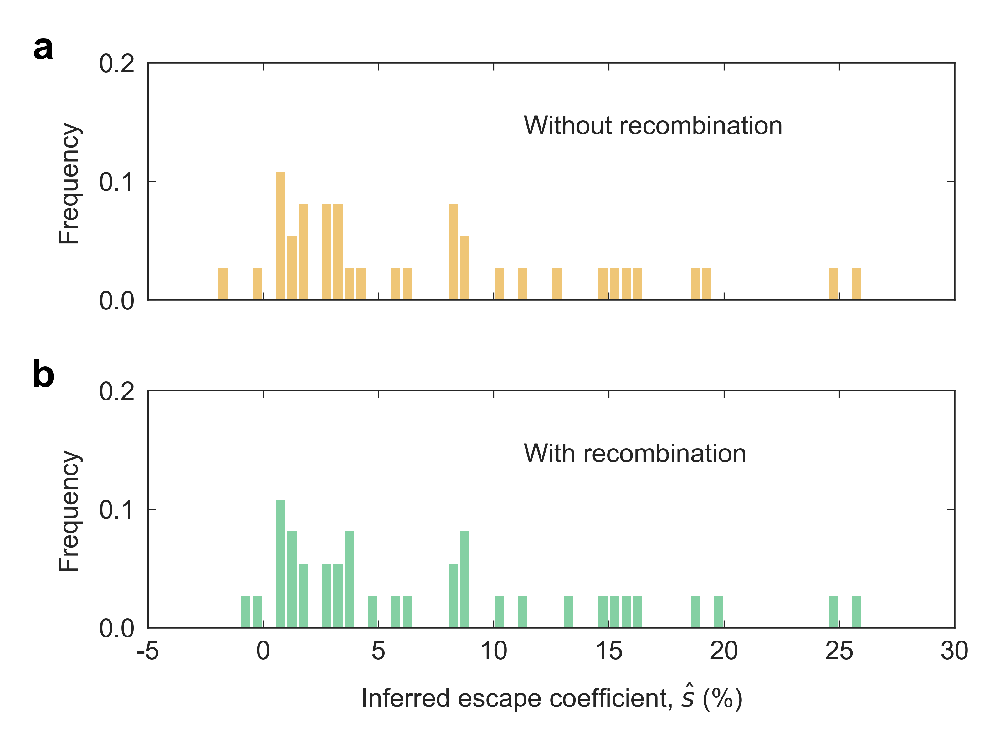

In [14]:
importlib.reload(mp)
importlib.reload(fig)

pdata = {
  'tags':['700010040-3','700010040-5','700010058-3','700010058-5','700010077-3','700010077-5',
          '700010470-3','700010470-5','700010607-3','700010607-5','703010131-3','703010131-5',
          '703010159-3','703010159-5','703010256-3','703010256-5','704010042-3','704010042-5',
          '705010162-3','705010162-5','705010185-3','705010185-5','705010198-3','705010198-5',
          '706010164-3','706010164-5'],
}

fig.plot_tc_rec(**pdata)
plt.show()

<a id='su:Figure_sc'></a>
### Supplementary Figure Inferred selection coefficients for escape sites without vs with escape trait

Figure saved as sc_escape.pdf


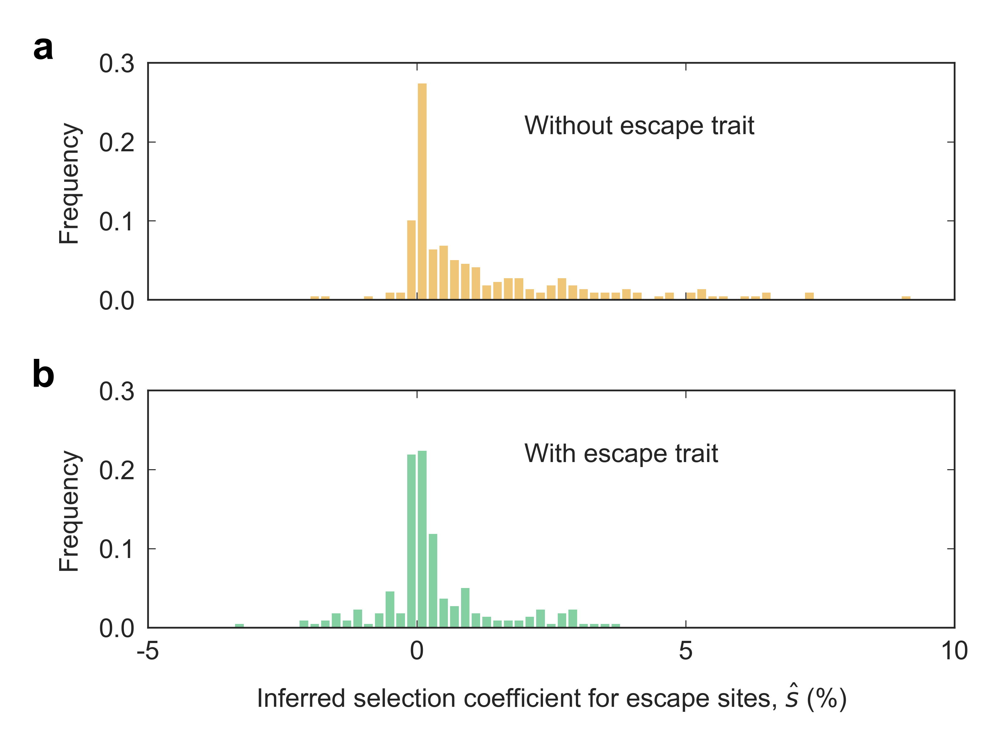

In [15]:
importlib.reload(mp)
importlib.reload(fig)

pdata = {
    'tags':['700010040-3','700010040-5','700010058-3','700010058-5','700010077-3','700010077-5',
            '700010470-3','700010470-5','700010607-3','700010607-5','703010131-3','703010131-5',
            '703010159-3','703010159-5','703010256-3','703010256-5','704010042-3','704010042-5',
            '705010162-3','705010162-5','705010185-3','705010185-5','705010198-3','705010198-5',
            '706010164-3','706010164-5'],
}

fig.plot_sc_escape(**pdata)
plt.show()

<a id='su:Figure_CH042'></a>
### Supplementary Figure. One special case for fitness gain due to reversion mutation
Fitness due to reversion (CH042)

Figure saved as reversion-CH042.pdf


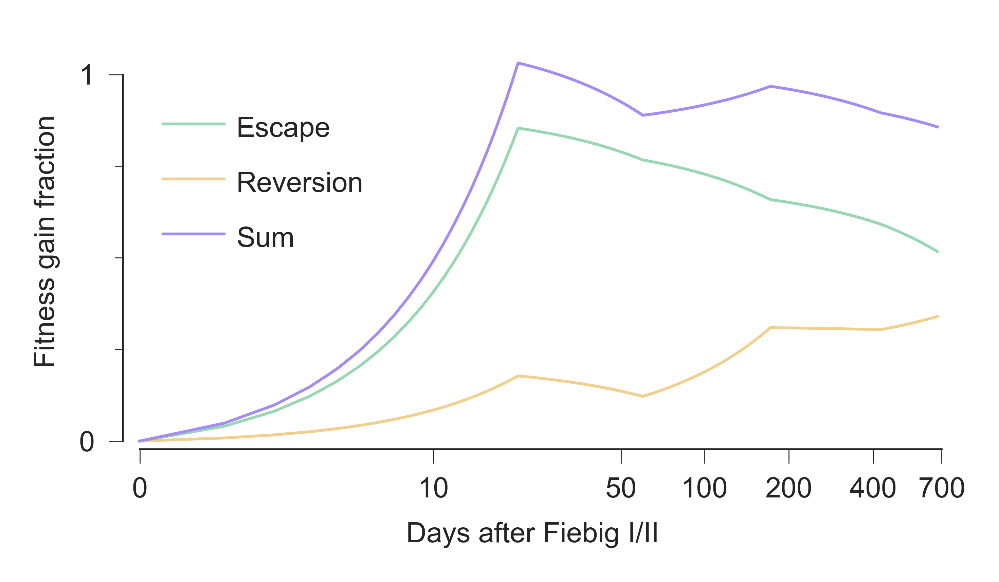

In [16]:
importlib.reload(mp)
importlib.reload(fig)

# ppts = ['700010470', '700010077', '700010058', '700010040', '700010607','706010164', '705010198', 
#         '705010185', '705010162', '704010042', '703010256', '703010159', '703010131']

# 704010042,
pdata = { 'ppt':       '704010042', }
fig.plot_single_fraction(**pdata)
plt.show()

# for ppt in ppts:
#     pdata['ppt'] = ppt
#     fig.plot_single_fraction(**pdata)
#     plt.show()